## Diagnose HSC reduction

In [1]:
import numpy as np
from astropy.io import fits
from astropy.table import Table
import matplotlib.pyplot as plt
import matplotlib.patches as patches

### Get exposure IDs for calib frames

In [244]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

In [537]:
where = "exposure.observation_type='bias'"
exps = list(queryData("raw", collections='HSC/raw/all',
                      instrument="HSC", where=where))
expids = tuple(np.unique(tuple(x.dataId["exposure"] for x in exps)))
print(f'BIASEXPS="{expids}"')

BIASEXPS="(106440, 106442, 106444, 106446, 106448, 106460, 106462, 106464, 106466, 106468, 196854, 196856, 196858, 196860, 196862, 196864, 196866, 196868, 196870, 196872, 202548, 202550, 202552, 202554, 202556, 202558, 202560, 202562, 202564, 202566)"


In [292]:
where = "exposure.observation_type='dark' AND detector=0"
exps = list(queryData("raw", collections='HSC/raw/all',
                      instrument="HSC", where=where))
expids = tuple(np.unique(tuple(x.dataId["exposure"] for x in exps)))
print(f'DARKEXPS="{expids}"')

DARKEXPS="(106451, 106453, 106455, 106457, 106459, 196874, 196876, 196878, 196880, 196882, 202568, 202570, 202572, 202574, 202576, 281076, 281078, 281302, 281304, 281306, 281308, 281310, 307798, 307800, 307802, 307804, 307806)"


In [ ]:
WHERE="instrument='HSC' AND band=g AND exposure.observation_type='dark'"
butler query-data-ids $REPO exposure --collections HSC/raw/all --datasets 'raw' --where $WHERE

In [ ]:
WHERE="instrument='HSC' AND band=g AND exposure.observation_type='dark'"

butler query-data-ids $REPO exposure --collections HSC/raw/all --datasets 'raw' --where "physical_filter='HSC-G' AND instrument='HSC'"

In [286]:
where = "exposure.observation_type='domeflat'"
exps = list(queryData("raw", collections='HSC/raw/all',
                      instrument="HSC", where=where))
expids = tuple(np.unique(tuple(x.dataId["exposure"] for x in exps)))
print(f'FLATEXPS="{expids}"')

FLATEXPS="(106486, 106488, 106490, 106492, 106494, 106496, 106498, 106500, 106502, 106504, 196834, 196836, 196838, 196840, 196842, 196844, 196846, 196848, 196850, 196852, 203400, 203402, 203404, 203406, 203408, 203410, 203412, 203414, 203416, 203418, 276834, 276836, 276838, 276840, 276842, 276844, 276846, 276848, 276850, 276852, 284018, 284020, 284022, 284024, 284026, 284028, 284030, 284032, 284034, 284036, 299084, 299086, 299088, 299090, 299092, 299094, 299096, 299098, 299100, 299102, 306756, 306758, 306760, 306762, 306764, 306766, 306768, 306770, 306772, 306774)"


In [540]:
where = "exposure.observation_type='domeflat'"
exps = list(queryData("raw", collections='HSC/raw/all',
                      instrument="HSC", where=where))
expids = tuple(np.unique(tuple(x.dataId["exposure"] for x in exps)))
print(f'FLATEXPS="{expids}"')

FLATEXPS="(106486, 106488, 106490, 106492, 106494, 106496, 106498, 106500, 106502, 106504, 196834, 196836, 196838, 196840, 196842, 196844, 196846, 196848, 196850, 196852, 203400, 203402, 203404, 203406, 203408, 203410, 203412, 203414, 203416, 203418, 276834, 276836, 276838, 276840, 276842, 276844, 276846, 276848, 276850, 276852)"


In [3]:
where = "exposure.observation_type='science'"
exps = list(queryData("raw", collections='HSC/raw/all',
                      instrument="HSC", where=where))
expids = tuple(np.unique(tuple(x.dataId["exposure"] for x in exps)))
print(f'SCIEXPS="{expids}"')

SCIEXPS="(109704, 109706, 109708, 109710, 109712, 109714, 109720, 109722, 109744, 109746, 109748, 109750, 109752, 109754, 109760, 109762, 197336, 197338, 197340, 197342, 206932, 206934, 206936, 206940, 206942, 206944, 277192, 284652, 285228, 285232, 308696)"


### Decertify any calibration data

In [328]:
import lsst.daf.butler
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'

# writeable_butler = Butler(
#     repo_path, writeable=True
# )

# writeable_butler.registry.decertify(
#     collection=f'HSC/calib/{OBJ}',
#     datasetType='bias',
#     timespan=lsst.daf.butler.Timespan(None, None),
# )

### Check Bias reduction

In [389]:
OBJ = 'dw1008p7058'
# OBJ = 'dw0108p1650'

In [390]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

qda = butler.registry.queryDatasetAssociations
coll = f"HSC/calib/{OBJ}"
exps = list(qda("bias", collections=coll))

dets = np.array([x.ref.dataId['detector'] for x in exps])
all_dets = np.arange(0, 112, 1)
print('Not having bias:', all_dets[~np.in1d(all_dets, dets)])

Not having bias: [9]


In [331]:
exp.dataId

{instrument: 'HSC', detector: 6}

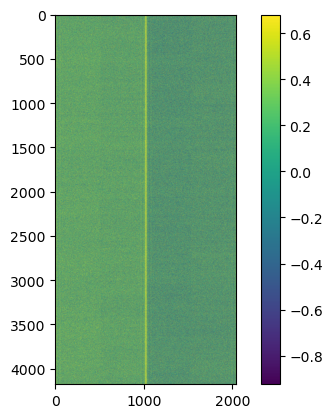

In [332]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

where = "detector=6"
exp = list(queryData("bias", collections=f"HSC/calib/{OBJ}/bias",
                      instrument="HSC", where=where))[0]

img = butler.get(exp.datasetType, exp.dataId, collections=f"HSC/calib/{OBJ}/bias",
                  instrument="HSC")
data = img.getImage().array

plt.imshow(data, vmin=np.nanpercentile(data, 3), vmax=np.nanpercentile(data, 90))
plt.colorbar()

### Check Dark reduction

In [395]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

qda = butler.registry.queryDatasetAssociations
coll = f"HSC/calib/{OBJ}"
exps = list(qda("dark", collections=coll))

dets = np.array([x.ref.dataId['detector'] for x in exps])
all_dets = np.arange(0, 112, 1)
print('Not having dark:', all_dets[~np.in1d(all_dets, dets)])

Not having dark: [9]


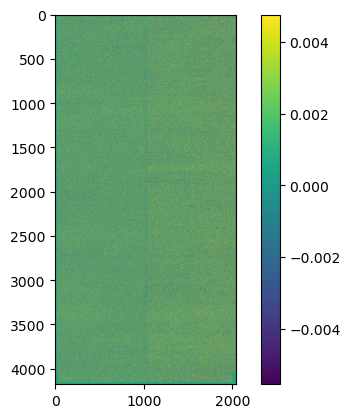

In [393]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

where = "detector=62"
exp = list(queryData("dark", collections="HSC/calib/NGC4605/dark",
                      instrument="HSC", where=where))[0]

img = butler.get(exp.datasetType, exp.dataId, collections="HSC/calib/NGC4605/dark",
                  instrument="HSC")
data = img.getImage().array

plt.imshow(data, vmin=np.nanpercentile(data, 3), vmax=np.nanpercentile(data, 90))
plt.colorbar()

## Check flat

In [397]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

qda = butler.registry.queryDatasetAssociations
coll = f"HSC/calib/{OBJ}"
exps = list(qda("flat", collections=coll))

dets = np.array([x.ref.dataId['detector'] for x in exps])
all_dets = np.arange(0, 112, 1)
print('Not having flat:', all_dets[~np.in1d(all_dets, dets)])

Not having flat: [9]


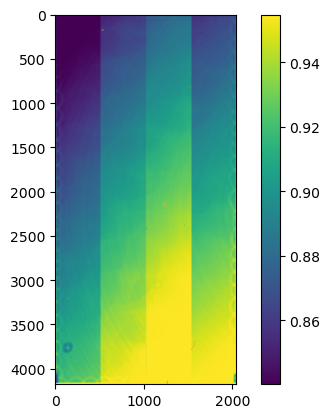

In [399]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

where = "detector=21 AND physical_filter='HSC-Z'"
exp = list(queryData("flat", collections=f"HSC/calib/{OBJ}/flat",
                      instrument="HSC", where=where))[0]

img = butler.get(exp.datasetType, exp.dataId, collections=f"HSC/calib/{OBJ}/flat",
                  instrument="HSC")
data = img.getImage().array

plt.imshow(data, vmin=np.nanpercentile(data, 3), vmax=np.nanpercentile(data, 90))
plt.colorbar()

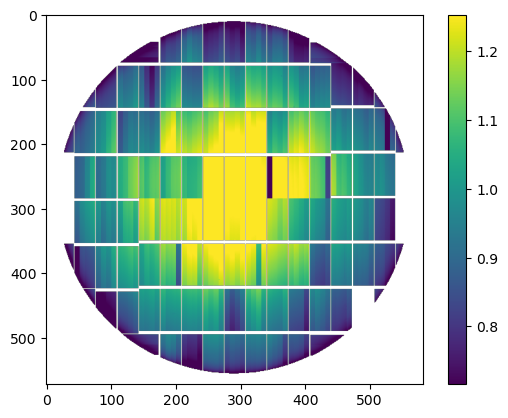

In [400]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

where = "physical_filter='HSC-Z'"
exp = list(queryData("flatMosaic64", collections=f"HSC/calib/{OBJ}/flat",
                      instrument="HSC", where=where))[0]

img = butler.get(exp.datasetType, exp.dataId, collections=f"HSC/calib/{OBJ}/flat",
                  instrument="HSC")
data = img.array

plt.imshow(data, vmin=np.nanpercentile(data, 3), vmax=np.nanpercentile(data, 90))
plt.colorbar()

## Check sky

In [401]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

qda = butler.registry.queryDatasetAssociations
coll = f"HSC/calib/{OBJ}"
exps = list(qda("sky", collections=coll))

dets = np.array([x.ref.dataId['detector'] for x in exps])
all_dets = np.arange(0, 112, 1)
print('Not having sky:', all_dets[~np.in1d(all_dets, dets)])

Not having sky: [  9  33 104 105 106 107 108 109 110 111]


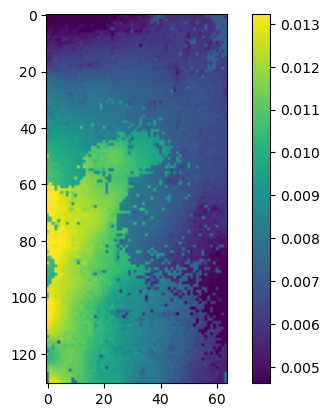

In [402]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets

where = "detector=21"
exp = list(queryData("sky", collections=f"HSC/calib/{OBJ}/sky",
                      instrument="HSC", where=where))[0]

img = butler.get(exp.datasetType, exp.dataId, collections=f"HSC/calib/{OBJ}/sky",
                  instrument="HSC")
data = img.getImage().array

plt.imshow(data, vmin=np.nanpercentile(data, 3), vmax=np.nanpercentile(data, 99))
plt.colorbar()

## Check Step 1 results (post-ISR calexp)

In [403]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = f"HSC/runs/{OBJ}"
where = "visit=284652"
# exp = list(queryData("calexpBackground", collections=collection, instrument="HSC", where=where))[0]
exps = list(queryData("calexp", collections=collection, instrument="HSC", where=where))

In [404]:
dets = np.array([x.dataId['detector'] for x in exps])
all_dets = np.arange(0, 112, 1)
print('Not having postISR:', all_dets[~np.in1d(all_dets, dets)])

Not having postISR: [9]


In [405]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = f"HSC/runs/{OBJ}"
where = "detector=5 AND visit=284652"
# where = "detector=5 AND visit=109710"
# exp = list(queryData("calexpBackground", collections=collection, instrument="HSC", where=where))[0]
# calexp = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC")
# data = calexp.getImage().array

In [69]:
# p = calexp.getPhotoCalib()
# zp = p.instFluxToMagnitude(1)

In [406]:
list(queryData("calexpBackground", collections=collection, instrument="HSC", where=where))

[DatasetRef(DatasetType('calexpBackground', {band, instrument, detector, physical_filter, visit}, Background), {instrument: 'HSC', detector: 5, visit: 284652, band: 'z', physical_filter: 'HSC-Z'}, run='HSC/runs/dw1008p7058/20250128T202002Z', id=39886657-4f02-4653-bf62-a2e62c118728)]

In [409]:
ref = list(queryData("calexpBackground", collections=collection, instrument="HSC", where=where))[-1]
print(ref.run)
calexpBackground = butler.get(ref, collections=ref.run).getImage().array

ref = list(queryData("calexp", collections=collection, instrument="HSC", where=where))[-1]
print(ref.run)
calexp = butler.get(ref, collections=ref.run).getImage().array

HSC/runs/dw1008p7058/20250128T202002Z


/tmp/ipykernel_2038762/2979025543.py:3: UserWarning: Collections should not be specified with DatasetRef
  calexpBackground = butler.get(ref, collections=ref.run).getImage().array


HSC/runs/dw1008p7058/20250128T202002Z


/tmp/ipykernel_2038762/2979025543.py:7: UserWarning: Collections should not be specified with DatasetRef
  calexp = butler.get(ref, collections=ref.run).getImage().array


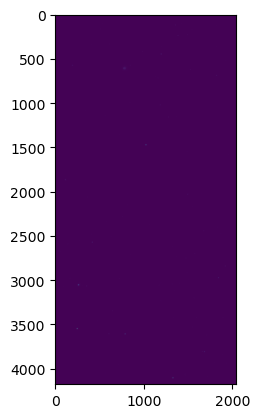

In [410]:
plt.imshow(calexp)

- 20241227T061121Z: mesh size = 256
- 20241228T215932Z: default mesh size = 128
- 20241228T221651Z: mesh=1024, useapprox =False
- 20241228T223237Z: mesh 1024, useapprox=False for both background and detection
- 20241228T230157Z: g-band
- 20241228T232902Z: mesh = 1024 also for `calibrate` task, useapprox=True for all tasks
- 20241228T233511Z: mesh=512 for both calibrate and charImage taks, useapprox=True for all tasks
- 20241229T004219Z: mesh=512 for both calibrate and charImage taks, useapprox=False for all tasks

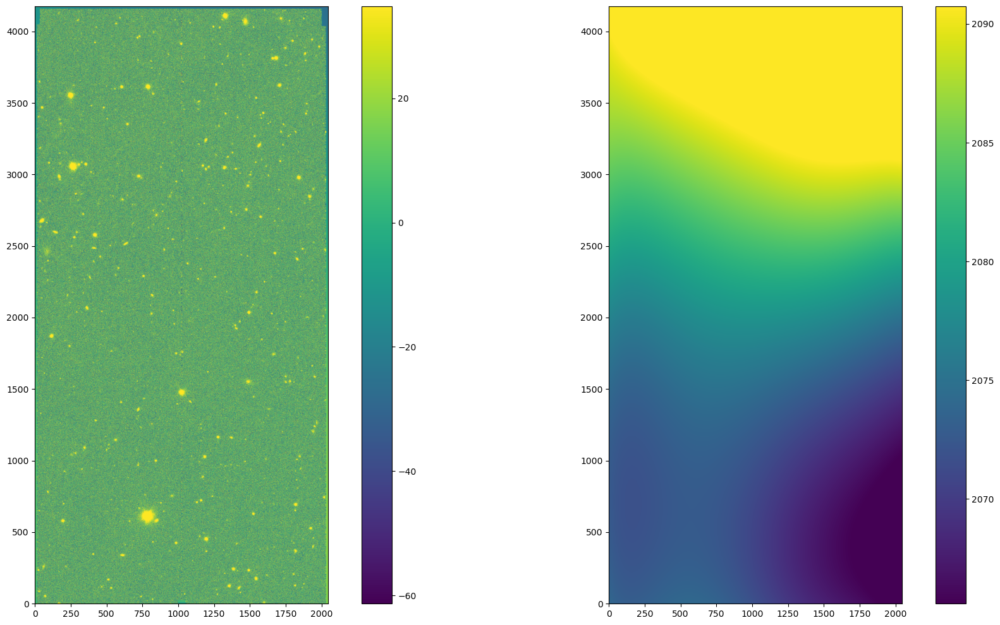

In [412]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(20, 10))

im = ax1.imshow(calexp, vmin=np.nanpercentile(calexp, 1), vmax=np.nanpercentile(calexp, 90), origin='lower')
plt.colorbar(im)

im = ax2.imshow(calexpBackground, vmin=np.nanpercentile(calexpBackground, 3), vmax=np.nanpercentile(calexpBackground, 80), origin='lower')
plt.colorbar(im)

plt.tight_layout()

In [515]:
ref = list(queryData("calexp", collections=collection, instrument="HSC", where=where))[3]
print(ref.run)
calexp1 = butler.get(ref, collections=ref.run).getImage().array

ref = list(queryData("calexp", collections=collection, instrument="HSC", where=where))[5]
print(ref.run)
calexp2 = butler.get(ref, collections=ref.run).getImage().array

HSC/runs/NGC4605/2024_12_sky/20241228T222359Z
HSC/runs/NGC4605/2024_12_sky/20241228T232902Z


In [ ]:
from lsst.geom import SpherePoint
import lsst.geom

In [490]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = "HSC/runs/NGC4605/2024_12"
where = "physical_filter='HSC-G'"
refs = list(queryData("calexp", collections=collection, instrument="HSC", where=where))

In [477]:
for ref in refs:
    exp = butler.get(ref, collections=ref.run)
    bbox = exp.getBBox()
    w = exp.getWcs()
    skycoord = SpherePoint(191.45618*lsst.geom.degrees, 61.96947*lsst.geom.degrees)
    point = lsst.geom.Point2I(w.skyToPixel(skycoord))
    if bbox.contains(point):
        print(ref)
    del exp

calexp@{instrument: 'HSC', detector: 82, visit: 277192, ...}, sc=ExposureF] (id=bdad754a-8b1a-4fe3-ba38-8d68198886ec)


In [495]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = "HSC/runs/NGC4605/2024_12_sky"
where = "physical_filter='HSC-G' AND visit=277192 AND detector=82"
refs = list(queryData("calexp", collections=collection, instrument="HSC", where=where))
refs

[DatasetRef(DatasetType('calexp', {band, instrument, detector, physical_filter, visit}, ExposureF), {instrument: 'HSC', detector: 82, visit: 277192, ...}, id=119e1a63-0fcd-4374-befe-91c654e5e657, run='HSC/runs/NGC4605/2024_12_sky/20241228T230157Z')]

In [499]:
where = "physical_filter='HSC-G' AND visit=277192 AND detector=82"
ref = list(queryData("calexp", collections=collection, instrument="HSC", where=where))[0]
print(ref.run)
calexp = butler.get(ref, collections=ref.run)#.getImage().array

HSC/runs/NGC4605/2024_12_sky/20241228T230157Z


In [500]:
calexp.writeFits('./visit_277192_detector_82_20241228T230157Z.fits')

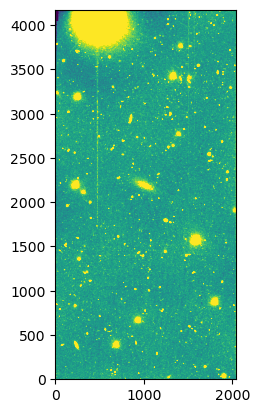

In [497]:
plt.imshow(calexp, vmin=np.nanpercentile(calexp, 10), vmax=np.nanpercentile(calexp, 80), origin='lower')

In [134]:
# fig, ax = plt.subplots(figsize=(10, 10))
# plt.imshow(data, vmin=np.nanpercentile(data, 2), vmax=np.nanpercentile(data, 97), origin='lower')
# plt.colorbar()

In [200]:
exp = list(queryData("calexp", collections=collection, instrument="HSC", where=where))[0]
calexp = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC")

In [201]:
calexp.getWcs()

FITS standard SkyWcs:
Sky Origin: (191.4936047117, +62.0001055958)
Pixel Origin: (1073.83, 2116.76)
Pixel Scale: 0.160703 arcsec/pixel

In [202]:
# zp: 
calexp.getPhotoCalib().instFluxToMagnitude(1)

33.07350875348248

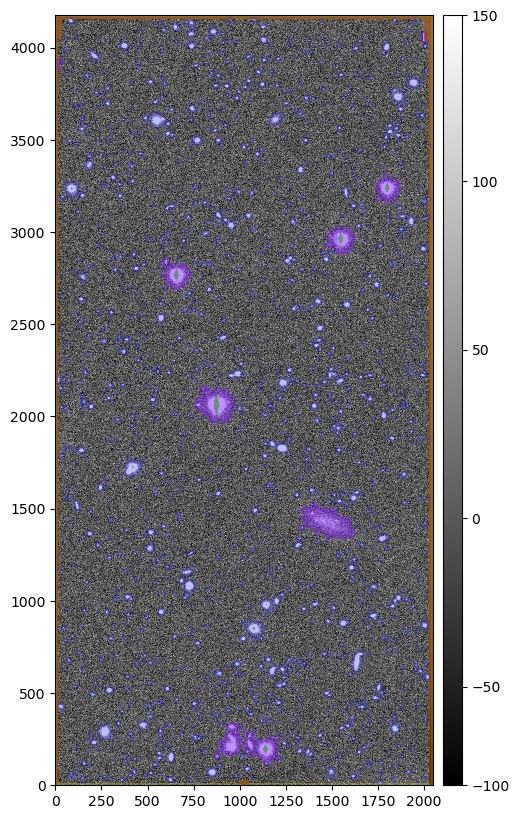

In [203]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.getDisplay(frame=fig)
display.scale("linear", "zscale")
# display.image(calexp)
display.mtv(calexp);

LOGFILE=$LOGDIR/NGC4605_step1.log; \
date | tee $LOGFILE; \
pipetask --long-log run --register-dataset-types -j 60 \
-b $REPO --instrument lsst.obs.subaru.HyperSuprimeCam \
-i HSC/raw/all,HSC/calib/NGC4605,HSC/calib,HSC/calib/unbounded,refcats/gen2,skymaps \
-o $OUTPUT \
-p $DRP_PIPE_DIR/pipelines/HSC/DRP-RC2.yaml#step1 \
-d "instrument='HSC' AND exposure=109712 AND detector=5" \
2>&1 | tee -a $LOGFILE; \
date | tee -a $LOGFILE

In [ ]:
-c characterizeImage:background.approxOrderX=1
-c characterizeImage:detection.background.approxOrderX=1

LOGFILE=$LOGDIR/NGC4605_step1.log; \
date | tee $LOGFILE; \
pipetask --long-log run --register-dataset-types -j 60 \
-b $REPO --instrument lsst.obs.subaru.HyperSuprimeCam \
-i HSC/raw/all,HSC/calib/NGC4605,HSC/calib,HSC/calib/unbounded,refcats/gen2,skymaps \
-o $OUTPUT \
-p $DRP_PIPE_DIR/pipelines/HSC/DRP-RC2.yaml#step1 \
-d "instrument='HSC' AND exposure=109712 AND detector=5" \
-c characterizeImage:background.binSize=512 \
-c characterizeImage:detection.background.binSize=512 \
-c calibrate:detection.background.binSize=512 \
-c characterizeImage:background.useApprox=False \
-c characterizeImage:detection.background.useApprox=False \
-c calibrate:detection.background.useApprox=False \
2>&1 | tee -a $LOGFILE; \
date | tee -a $LOGFILE

### G-band
    LOGFILE=$LOGDIR/NGC4605_step1.log; \
    date | tee $LOGFILE; \
    pipetask --long-log run --register-dataset-types -j 60 \
    -b $REPO --instrument lsst.obs.subaru.HyperSuprimeCam \
    -i HSC/raw/all,HSC/calib/NGC4605,HSC/calib,HSC/calib/unbounded,refcats/gen2,skymaps \
    -o $OUTPUT \
    -p $DRP_PIPE_DIR/pipelines/HSC/DRP-RC2.yaml#step1 \
    -d "instrument='HSC' AND exposure=277192 AND detector=82" \
    -c characterizeImage:background.binSize=1024 \
    -c characterizeImage:detection.background.binSize=1024 \
    -c characterizeImage:background.useApprox=False \
    -c characterizeImage:detection.background.useApprox=False \
    2>&1 | tee -a $LOGFILE; \
    date | tee -a $LOGFILE

In [ ]:
LOGFILE=$LOGDIR/NGC4605_step1.log; \
date | tee $LOGFILE; \
pipetask --long-log run --register-dataset-types -j 60 \
-b $REPO --instrument lsst.obs.subaru.HyperSuprimeCam \
-i HSC/raw/all,HSC/calib/NGC4605,HSC/calib,HSC/calib/unbounded,refcats/gen2,skymaps \
-o $OUTPUT \
-p $DRP_PIPE_DIR/pipelines/HSC/DRP-RC2.yaml#step1 \
-d "instrument='HSC' AND exposure=277192 AND detector=82" \
-c characterizeImage:background.binSize=1024 \
-c characterizeImage:detection.background.binSize=1024 \
-c characterizeImage:background.useApprox=False \
-c characterizeImage:detection.background.useApprox=False \
2>&1 | tee -a $LOGFILE; \
date | tee -a $LOGFILE

In [ ]:
-c characterizeImage:background.useApprox=True \
-c characterizeImage:detection.background.useApprox=False \

In [ ]:
-c characterizeImage:detection.background.useApprox=False \

In [337]:
hdu = fits.open('/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo/HSC/runs/NGC4605/2024_12_sky/20241228T215932Z/calexp/20170403/r/HSC-R2/109712/calexp_HSC_r_HSC-R2_109712_1_43_HSC_runs_NGC4605_2024_12_sky_20241228T215932Z.fits')
data1 = hdu[1].data

hdu = fits.open('/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo/HSC/runs/NGC4605/2024_12_sky/20241227T061121Z/calexp/20170403/r/HSC-R2/109712/calexp_HSC_r_HSC-R2_109712_1_43_HSC_runs_NGC4605_2024_12_sky_20241227T061121Z.fits')
data2 = hdu[1].data

In [339]:
diff = data1 - data2

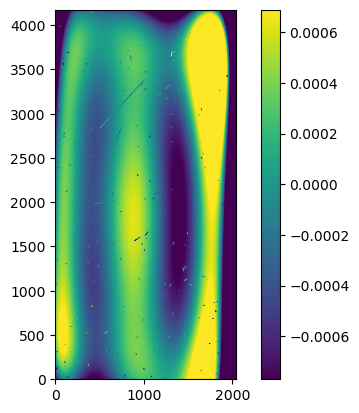

In [340]:
plt.imshow(diff, vmin=np.nanpercentile(diff, 10), vmax=np.nanpercentile(diff, 90), origin='lower')
plt.colorbar()

In [294]:
fig, ax = plt.subplots(figsize=(10, 10))
data = hdu[0].data
plt.imshow(data, vmin=np.nanpercentile(data, 2), vmax=np.nanpercentile(data, 97), origin='lower')

## Check step 2a product: visitSummary and SkyCorr

In [413]:
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
collection = f"HSC/runs/{OBJ}"

from collections import defaultdict
grouped_by_tract = defaultdict(set)
for data_id in butler.registry.queryDataIds(
    ["tract", "visit", "detector"],
    datasets="visitSummary",
    collections=collection,
    instrument="HSC",
    # visit=109704,
):
    grouped_by_tract[data_id["tract"]].add(data_id)

print({k: len(v) for k, v in grouped_by_tract.items()})

{18360: 164, 18359: 231, 18358: 39, 18440: 145, 18441: 146, 18439: 20, 18442: 4}


In [351]:
# ids = []

# for data_id in butler.registry.queryDataIds(
#     ["tract", "patch", "visit", "detector"],
#     datasets="visitSummary",
#     collections=collection,
#     instrument="HSC",
#     # visit=109706,
# ):
#     # if data_id['detector'] == 50:
#     if data_id['tract'] == 17765 and data_id['patch'] == 51:
#         ids.append(data_id)

In [ ]:
1,8 = 17
3,1 = 27

In [110]:
# Check Skycorr
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = "HSC/runs/NGC4605/2024_12"

where = "detector=51 AND visit=109704"
exp = list(queryData("skyCorr", collections=collection, instrument="HSC", where=where))[0]

In [111]:
skyCorr = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC")
skyCorr = skyCorr.getImage().array

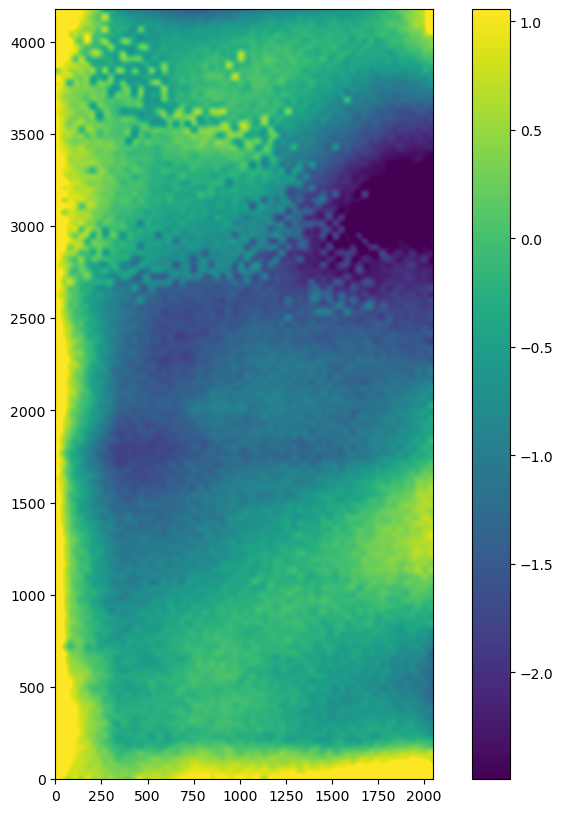

In [112]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(skyCorr, vmin=np.nanpercentile(skyCorr, 2), vmax=np.nanpercentile(skyCorr, 97), origin='lower')
plt.colorbar()

In [352]:
# Check calexp_skyCorr_visit_mosaic
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = f"HSC/runs/{OBJ}"

where = "visit=297998"
exp = list(queryData("calexp_skyCorr_visit_mosaic", collections=collection, instrument="HSC", where=where))[0]
calexp_skyCorr_visit_mosaic = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC").array

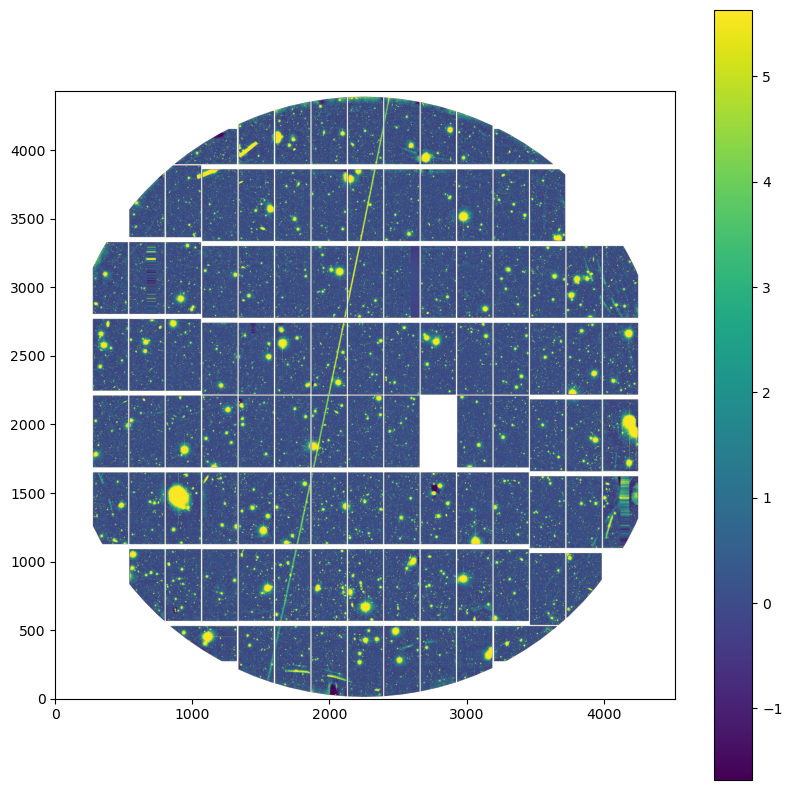

In [353]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(calexp_skyCorr_visit_mosaic, 
           vmin=np.nanpercentile(calexp_skyCorr_visit_mosaic, 2), 
           vmax=np.nanpercentile(calexp_skyCorr_visit_mosaic, 97), origin='lower')
plt.colorbar()

In [356]:
# Check calexp_skyCorr_visit_mosaic
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = f"HSC/runs/{OBJ}"

where = "visit=297998"
exp = list(queryData("calexpBackground_skyCorr_visit_mosaic", collections=collection, instrument="HSC", where=where))[0]
calexpBackground_skyCorr_visit_mosaic = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC").array

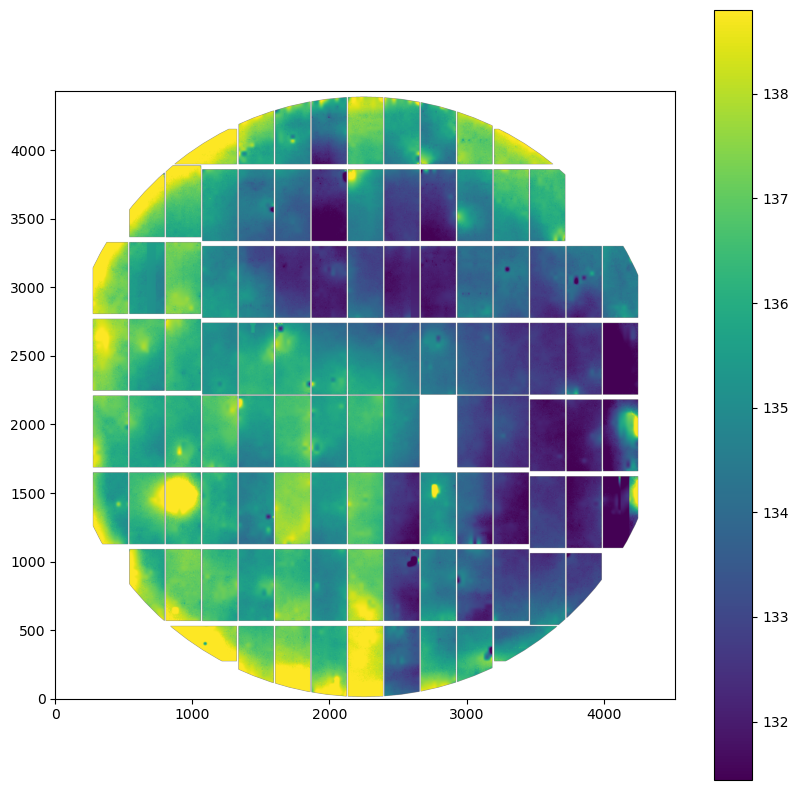

In [357]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(calexpBackground_skyCorr_visit_mosaic, 
           vmin=np.nanpercentile(calexpBackground_skyCorr_visit_mosaic, 2), 
           vmax=np.nanpercentile(calexpBackground_skyCorr_visit_mosaic, 97), origin='lower')
plt.colorbar()

### Check step 2b product: jointcalSkyWcsCatalog

In [101]:
# Check calexp_skyCorr_visit_mosaic
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = f"HSC/runs/{OBJ}"

where = "visit=197338"
exp = list(queryData("jointcalPhotoCalibCatalog", collections=collection, instrument="HSC", where=where))[0]

In [102]:
exp

DatasetRef(DatasetType('jointcalPhotoCalibCatalog', {band, instrument, skymap, physical_filter, tract, visit}, ExposureCatalog), {instrument: 'HSC', skymap: 'hsc_rings_v1', tract: 16817, visit: 197338, band: 'r', physical_filter: 'HSC-R2'}, run='HSC/runs/dw1336p5226/20250125T211957Z', id=4678d772-a450-4668-baf6-a5ba7b6ad12e)

### Check finalVisitSummary

In [129]:
# Check calexp_skyCorr_visit_mosaic
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = f"HSC/runs/{OBJ}"

exp = list(queryData("ccdVisitTable", collections=collection, instrument="HSC"))[0]
# exp = list(queryData("visitTable", collections=collection, instrument="HSC"))[0]
# exp = list(queryData("finalVisitSummary", collections=collection, instrument="HSC"))

In [124]:
exp

DatasetRef(DatasetType('ccdVisitTable', {instrument}, DataFrame), {instrument: 'HSC'}, run='HSC/runs/dw1336p5226/20250125T215635Z', id=e44a136b-d8de-46a5-9a10-d3b7738d435d)

In [125]:
visitSummary = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC")
# visitSummary = visitSummary.asAstropy()

In [126]:
visitSummary

,visitId,physical_filter,band,ra,dec,pixelScale,zenithDistance,expTime,zeroPoint,psfSigma,...,xSize,ySize,llcra,llcdec,ulcra,ulcdec,urcra,urcdec,lrcra,lrcdec
ccdVisitId,,,,,,,,,,,,,,,,,,,,,
39467200,197336,HSC-R2,r,204.836369,51.347557,0.157973,47.253078,30.0,30.302944,2.842921,...,2047,4175,204.683667,51.302279,204.686948,51.390425,204.988836,51.393615,204.982371,51.306394
39467201,197336,HSC-R2,r,204.511145,51.345048,0.159829,47.067234,30.0,30.314560,2.786732,...,2047,4175,204.358338,51.300822,204.358462,51.389315,204.664869,51.390278,204.661811,51.302075
39467202,197336,HSC-R2,r,204.183734,51.345082,0.159804,46.881691,30.0,30.328810,2.702456,...,2047,4175,204.033059,51.302204,204.030102,51.390368,204.336472,51.389283,204.336521,51.300793
39467203,197336,HSC-R2,r,203.858631,51.347713,0.157929,46.699070,30.0,30.344778,2.659850,...,2047,4175,203.712629,51.306637,203.706287,51.393801,204.008068,51.390554,204.011286,51.302409
39467204,197336,HSC-R2,r,205.161653,51.443868,0.156939,47.477669,30.0,30.309782,2.786151,...,2047,4175,205.010328,51.397195,205.016099,51.486663,205.311289,51.490959,205.302424,51.402936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41388897,206944,HSC-R2,r,203.668679,53.863306,0.159917,34.298786,120.0,32.547451,2.986119,...,2047,4175,203.829140,53.905748,203.830783,53.817460,203.506794,53.819181,203.506920,53.907720
41388898,206944,HSC-R2,r,203.321877,53.863079,0.159835,34.338047,120.0,32.514267,2.983281,...,2047,4175,203.483712,53.907759,203.483619,53.819191,203.159865,53.817016,203.161770,53.905244
41388899,206944,HSC-R2,r,202.977867,53.858447,0.157851,34.374664,120.0,32.541729,2.996943,...,2047,4175,203.138647,53.905033,203.136639,53.816842,202.818168,53.810692,202.822268,53.897951


In [127]:
from collections import defaultdict
import lsst.daf.butler as dafButler

grouped_by_tract = defaultdict(set)
for data_id in butler.registry.queryDataIds(
    ["tract", "visit", "detector"],
    datasets="visitSummary",
    collections="HSC/runs/dw1336p5226",
    instrument="HSC",
    # visit=971666,
):
    grouped_by_tract[data_id["tract"]].add(data_id)

print({k: len(v) for k, v in grouped_by_tract.items()})


{16817: 388, 16818: 271, 16968: 529, 16969: 438, 17115: 62, 17114: 99}


In [58]:
from astropy.coordinates import SkyCoord

In [59]:
obj_coord = SkyCoord(191.45589085404248, 61.969210000926694, unit='deg')

In [61]:
exp_coords = SkyCoord(visitSummary['ra'], visitSummary['decl'], unit='deg')

In [63]:
np.argsort(exp_coords.separation(obj_coord))

array([ 404,  304, 1267, ..., 1489,  698, 1497])

ERROR 2025-01-25T19:42:36.648-05:00 lsst.ctrl.mpexec.mpGraphExecutor ()(mpGraphExecutor.py:749) -   - FAILED: <makePsfMatchedWarp dataId={instrument: 'HSC', skymap: 'hsc_rings_v1', tract: 16817, patch: 74, visit: 206936, band: 'r', physical_filter: 'HSC-R2'}>
ERROR 2025-01-25T19:42:36.649-05:00 lsst.ctrl.mpexec.mpGraphExecutor ()(mpGraphExecutor.py:749) -   - FAILED_DEP: <assembleCoadd dataId={band: 'r', skymap: 'hsc_rings_v1', tract: 16817, patch: 74}>
ERROR 2025-01-25T19:42:36.650-05:00 lsst.daf.butler.cli.

In [160]:
# Check calexp_skyCorr_visit_mosaic
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = "HSC/runs/dw1336p5226"
where = "skymap='hsc_rings_v1'"
exps = list(queryData("skyMap", collections=collection, instrument="HSC", where=where))
print(exps)
exp = exps[0]
skyMap = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC")
skyMap.findTractPatchList()

[DatasetRef(DatasetType('skyMap', {skymap}, SkyMap), {skymap: 'hsc_rings_v1'}, run='skymaps', id=4bd43598-18e9-40eb-95e4-e62a9915bc63)]


In [164]:
from lsst.geom import SpherePoint, degrees
coord = SpherePoint(204.10781671459736*degrees, 52.43469165608932*degrees)

In [166]:
skyMap.findClosestTractPatchList([coord])

[(TractInfo(id=16968, ctrCoord=[-0.5566029706653853, -0.2357255109330576, 0.796634556457236]),
  (PatchInfo(index=Index2D(x=0, y=2), innerBBox=(minimum=(0, 8000), maximum=(3999, 11999)), outerBBox=(minimum=(0, 7900), maximum=(4099, 12099))),))]

In [165]:
skyMap.findTractPatchList([coord])

[(TractInfo(id=16968, ctrCoord=[-0.5566029706653853, -0.2357255109330576, 0.796634556457236]),
  (PatchInfo(index=Index2D(x=0, y=2), innerBBox=(minimum=(0, 8000), maximum=(3999, 11999)), outerBBox=(minimum=(0, 7900), maximum=(4099, 12099))),)),
 (TractInfo(id=16969, ctrCoord=[-0.5461707906569007, -0.25898040638511416, 0.796634556457236]),
  (PatchInfo(index=Index2D(x=8, y=2), innerBBox=(minimum=(32000, 8000), maximum=(35999, 11999)), outerBBox=(minimum=(31900, 7900), maximum=(35999, 12099))),))]

## Check Step3 `deepCoadd`!

In [414]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [428]:
# Check calexp_skyCorr_visit_mosaic
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
# collection = "HSC/runs/NGC4605/2024_12"
# collection = "HSC/runs/NGC4605/2024_12_sky"
collection = f"HSC/runs/{OBJ}"

# where = "physical_filter='HSC-R2' AND tract=16817 AND patch=51 AND skymap='hsc_rings_v1'"
where = "physical_filter='HSC-Z' AND tract=18359 AND patch=54 AND skymap='hsc_rings_v1'"
exps = list(queryData("deepCoadd_calexp", collections=collection, instrument="HSC", where=where))
# print(exps)
exp = exps[0]
deepCoadd = butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC")

In [429]:
exps

[DatasetRef(DatasetType('deepCoadd_calexp', {band, skymap, tract, patch}, ExposureF), {band: 'z', skymap: 'hsc_rings_v1', tract: 18359, patch: 54}, run='HSC/runs/dw1008p7058/20250129T000927Z', id=f0113886-903f-493d-9505-13ce213bc904)]

In [211]:
# list(butler.registry.queryDatasets(exp.datasetType))

In [430]:
deepCoadd

In [199]:
w = deepCoadd.getWcs()

In [200]:
w.skyToPixel(coord)

Point2D(2912.0091572380716, 10078.85621999397)

In [201]:
deepCoadd.getImage().array.shape

(4100, 4200)

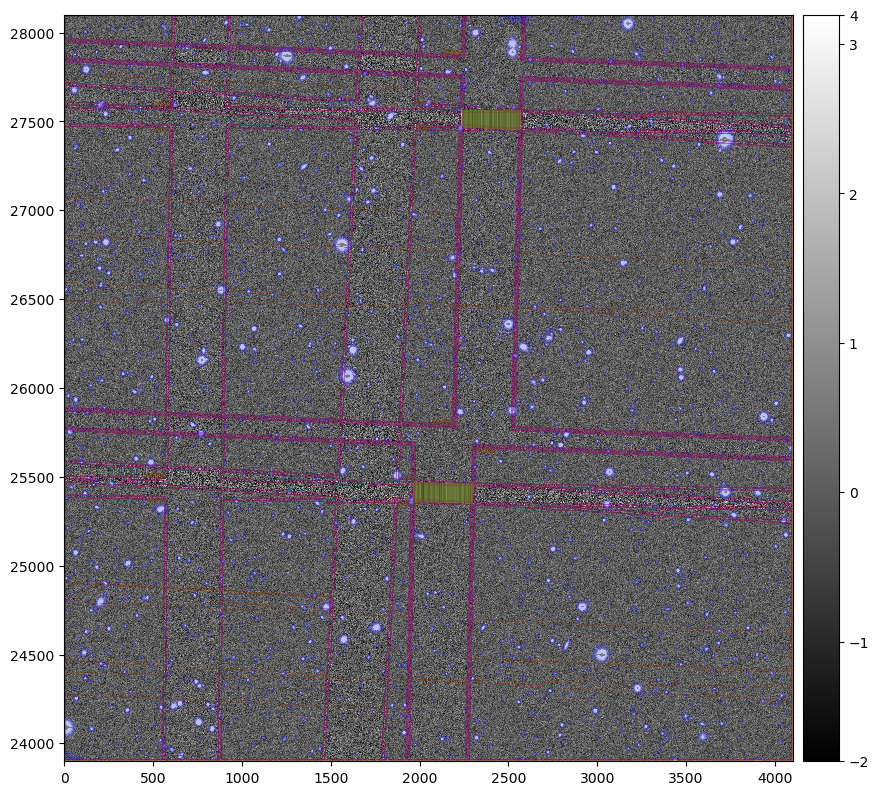

In [431]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.getDisplay(frame=fig)
display.scale("linear", "zscale")
display.image(deepCoadd)
# display.mtv(cutout);

In [432]:
deepCoadd.writeFits('tract18359_patch54_deepCoadd.fits')

In [ ]:
[(TractInfo(id=16968, ctrCoord=[-0.5566029706653853, -0.2357255109330576, 0.796634556457236]),
  (PatchInfo(index=Index2D(x=0, y=2), innerBBox=(minimum=(0, 8000), maximum=(3999, 11999)), outerBBox=(minimum=(0, 7900), maximum=(4099, 12099))),))]

In [176]:
0 * 8 + 2

2

In [175]:
# [exp.dataId['patch'] for exp in exps]

In [503]:
# deepCoadd.writeFits('dw1245p6158_deepCoadd_better_sky.fits')

In [148]:
exp

DatasetRef(DatasetType('deepCoadd', {band, skymap, tract, patch}, ExposureF), {band: 'r', skymap: 'hsc_rings_v1', tract: 16817, patch: 37}, run='HSC/runs/dw1336p5226/20250125T215635Z', id=15f15cdc-6e8e-40eb-998f-29841df396b0)

In [415]:
from cutout import generate_cutout, _get_patches
import astropy.units as u

In [420]:
butler = Butler(repo_path, instrument='HSC', collections=collection)
skymap = butler.get('skyMap', skymap='hsc_rings_v1')

- dw0108p1650: `17.231417225822774, 16.838790960356715`
- dw0106p1616b: `16.5218643374393, 16.28085595829385`

In [424]:
# ra, dec = 204.10781671459736, 52.43469165608932
ra, dec = 152.14053932599145, 70.97524696548678
butler = Butler(repo_path, instrument='HSC', collections=collection)
cutout, psf, flag = generate_cutout(butler, 'hsc_rings_v1', ra, dec, band='z', 
                               data_type='deepCoadd', half_size=150 * u.arcsec, verbose=True)

[(18359, 54) (18359, 55) (18360, 61) (18360, 62)]


In [427]:
cutout.writeFits('./dw1008p7058_z.fits')

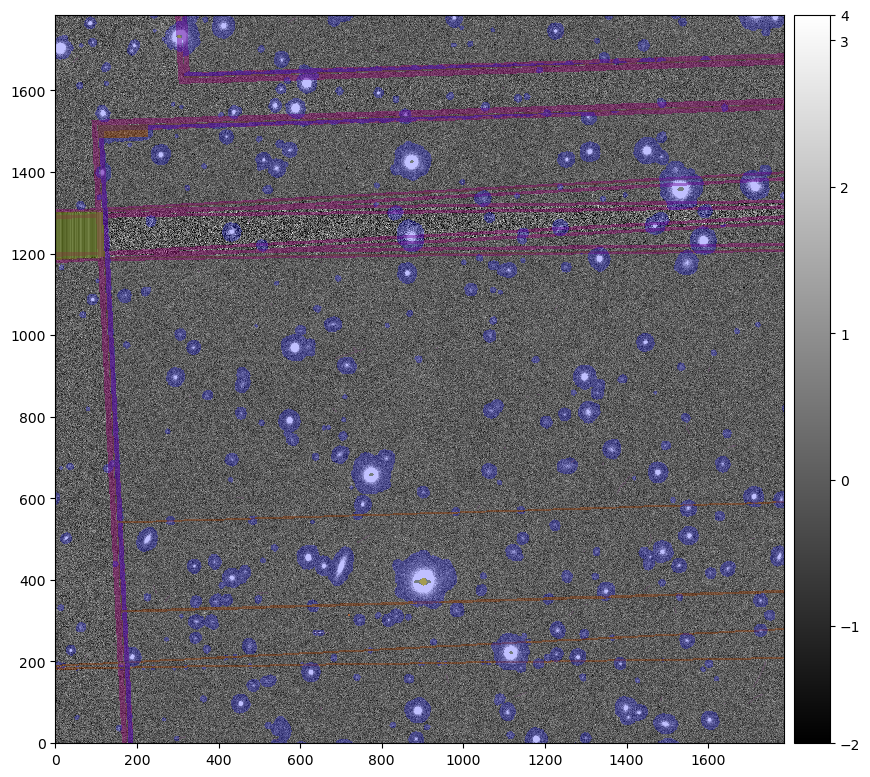

In [425]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
fig, ax = plt.subplots(figsize=(10, 10))
display = afwDisplay.getDisplay(frame=fig)
display.scale("linear", "zscale")
# display.image(deepCoadd)
display.mtv(cutout);

In [11]:
# 1,8 = 17 = 1*9 + 8
# 3,1 = 27 = 3*9 + 8
# 6,5 = 5*9+8 = 62 = 51

In [12]:
deepCoadd

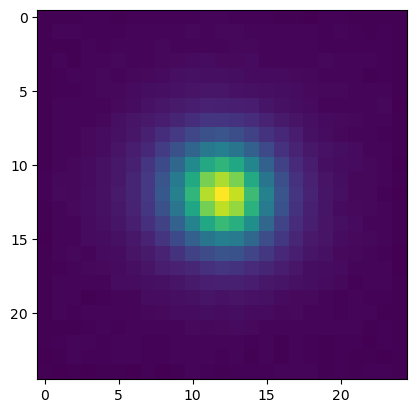

In [101]:
plt.imshow(psf.array)

In [123]:
deepCoadd = deepCoadd.getImage().array

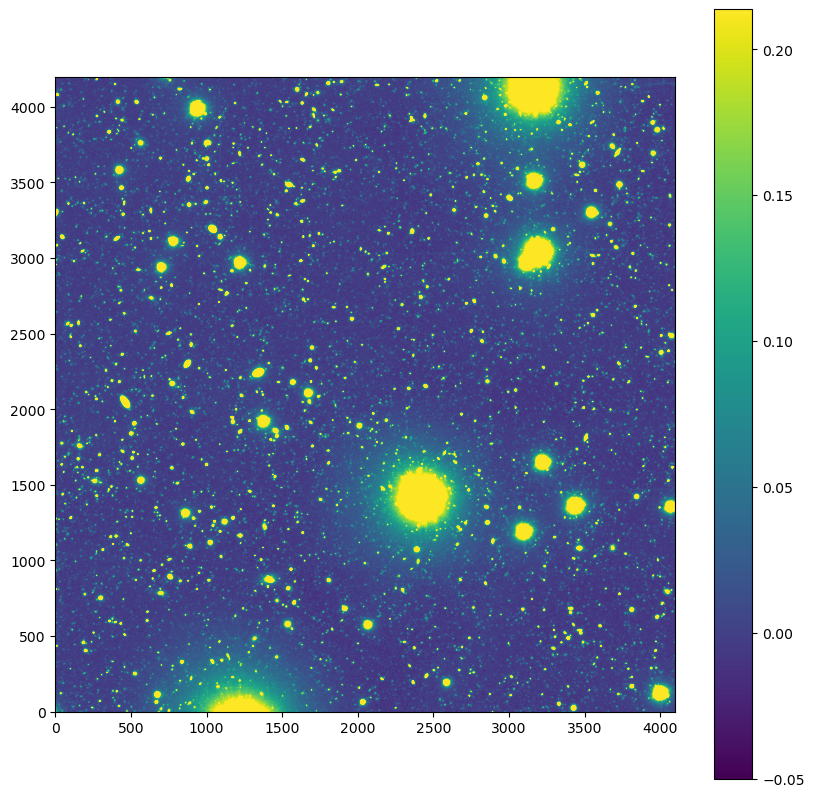

In [124]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(deepCoadd, 
           vmin=np.nanpercentile(deepCoadd, 2), 
           vmax=np.nanpercentile(deepCoadd, 97), origin='lower')
plt.colorbar()

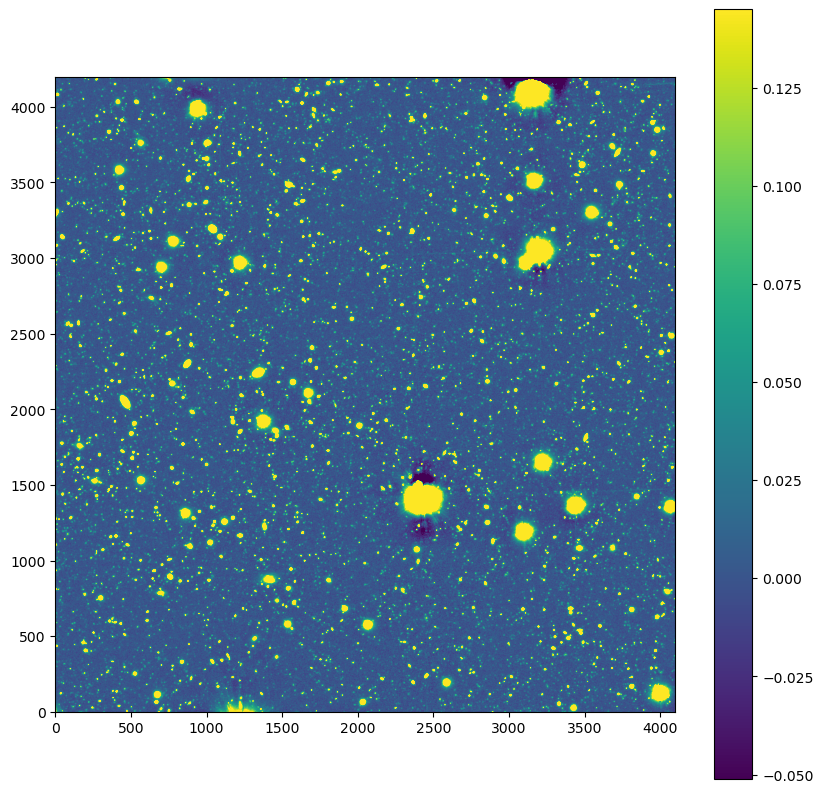

In [118]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(deepCoadd, 
           vmin=np.nanpercentile(deepCoadd, 2), 
           vmax=np.nanpercentile(deepCoadd, 97), origin='lower')
plt.colorbar()

In [15]:
data = fits.open('./dw1245p6158_deepCoadd.fits')[1].data
data_sky = fits.open('./dw1245p6158_deepCoadd_better_sky.fits')[1].data

In [16]:
diff = data - data_sky

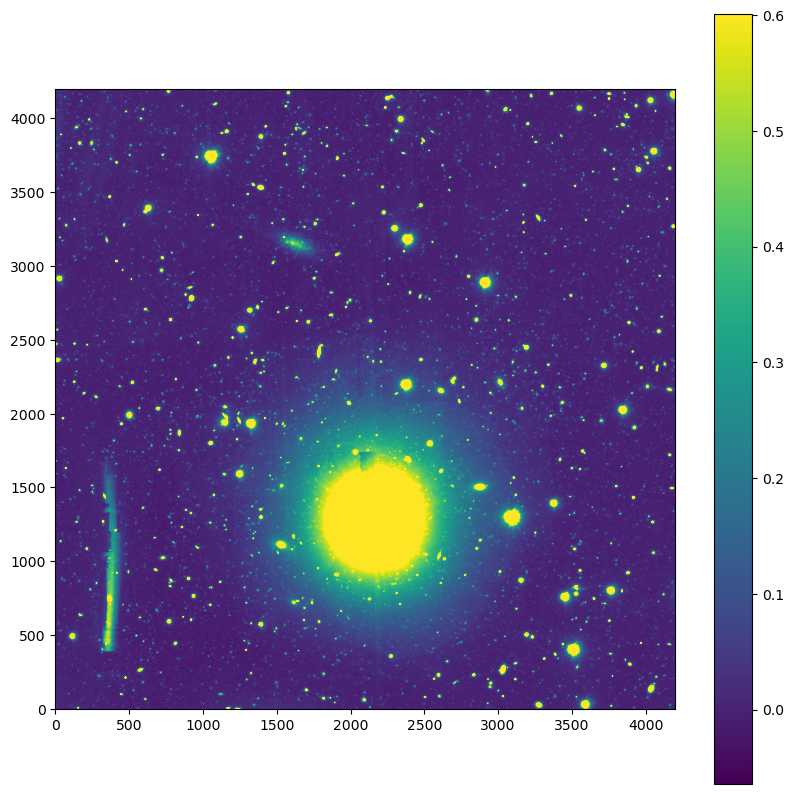

In [19]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(data_sky, 
           vmin=np.nanpercentile(data, 2), 
           vmax=np.nanpercentile(data, 97), origin='lower')
plt.colorbar()

---

### Check FGCM LUT

In [87]:
# Check calexp_skyCorr_visit_mosaic
from lsst.daf.butler import Butler
repo_path = '/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo'
butler = Butler(repo_path, instrument='HSC')
queryData = butler.registry.queryDatasets
collection = "HSC/runs/NGC4605/2024_12"

exp = list(queryData("fgcmLookUpTable", collections=collection, instrument="HSC"))[0]

In [88]:
butler.get(exp.datasetType, exp.dataId, collections=collection, instrument="HSC")

<class 'lsst.afw.table.BaseCatalog'>
   tablename     elevation               physicalFilters               ...                atmStdTrans                    luttype                   lut               
---------------- --------- ------------------------------------------- ... ------------------------------------------ -------------- --------------------------------
fgcm_atm_subaru3    4139.0 HSC-G,HSC-R,HSC-R2,HSC-I,HSC-I2,HSC-Z,HSC-Y ... 0.014489085413515568 .. 0.5305678844451904             I0        0.15959927 .. 0.012826154
                       nan                                             ...                                 nan .. nan             I1          -1.0372386 .. 0.7390837
                       nan                                             ...                                 nan .. nan          D_PMB                       0.0 .. 0.0
                       nan                                             ...                                 nan .. nan        D_LNPWV 

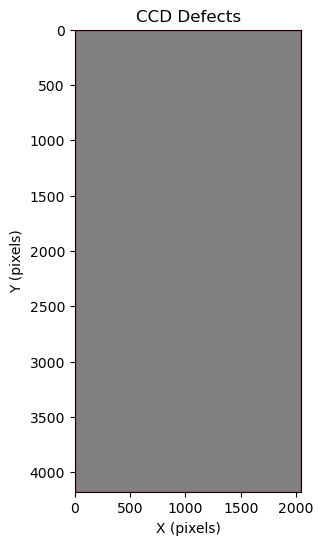

In [286]:
hdu = fits.open('/scratch/gpfs/JENNYG/jiaxuanl/HSC/repo/HSC/calib/curated/19700101T000000Z/defects/defects_HSC_1_47_HSC_calib_curated_19700101T000000Z.fits')
data = Table(hdu[1].data)

# Set up the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Draw the CCD boundaries (adjust as needed)
ccd_width = 2048
ccd_height = 4176
ax.set_xlim(0, ccd_width)
ax.set_ylim(0, ccd_height)
ax.set_aspect('equal')
ax.invert_yaxis()  # Invert y-axis for typical CCD coordinate systems

for row in data:
    rect = patches.Rectangle(
        (row["x0"], row["y0"]),  # Bottom-left corner
        row["width"],  # Width
        row["height"],  # Height
        linewidth=1,
        edgecolor='red',
        facecolor='gray',
    )
    ax.add_patch(rect)


# Labels and title
ax.set_title("CCD Defects")
ax.set_xlabel("X (pixels)")
ax.set_ylabel("Y (pixels)")

# Show the plot
plt.show()